In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
import os
import gc
import math
import time
import json
import random
from dataclasses import dataclass, asdict
from pathlib import Path
from collections import defaultdict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from tqdm.auto import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Subset

import torchvision
import torchvision.transforms.functional as TF

print("torch:", torch.__version__)
print("torchvision:", torchvision.__version__)
print("cuda available:", torch.cuda.is_available())

torch: 2.10.0+cu128
torchvision: 0.25.0+cu128
cuda available: True


In [3]:
@dataclass
class CFG:
    seed: int = 42

    # Use ONLY this shared Google Drive folder (no auto-detect)
    shared_data_url: str = "https://drive.google.com/drive/folders/1brsg6WzCyWLi5SpAzxe1UwNQx05dCAGc"

    # Canonical ADE20K paths (resolved from shared_data_url)
    data_root: str = ""
    train_img_dir: str = ""
    train_mask_dir: str = ""
    val_img_dir: str = ""
    val_mask_dir: str = ""
    test_img_dir: str = ""

    object_info_path: str = ""
    scene_categories_path: str = ""
    test_list_path: str = ""

    out_root: str = "outputs"
    ckpt_dir: str = "outputs/checkpoints"
    report_dir: str = "outputs/reports"
    fig_dir: str = "outputs/figures"
    test_pred_dir: str = "outputs/test_predictions"

    image_size: int = 384
    batch_size: int = 24
    num_workers: int = 4

    num_classes: int = 151   # class id 0..150 in mask
    ignore_index: int = 0

    epochs: int = 10
    lr: float = 3e-4
    weight_decay: float = 1e-4

    use_amp: bool = True
    quick_mode: bool = False
    quick_train_samples: int = 1500
    quick_val_samples: int = 300

    # Checkpoint / resume controls
    save_every: int = 1
    keep_epoch_ckpt_every: int = 5

    eval_every: int = 2  # evaluate every N epochs to save time
    resume_training: bool = True

    # Colab persistence
    use_colab_drive: bool = True
    drive_root: str = "/content/drive/MyDrive/CO5085_A2_ADE20K_Optimized"

cfg = CFG()


def set_seed(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True

set_seed(cfg.seed)

try:
    import google.colab  # type: ignore
    IN_COLAB = True
except Exception:
    IN_COLAB = False

if not IN_COLAB:
    raise RuntimeError("This notebook is configured to load data only from Google Drive shared folder and should be run on Colab.")

from google.colab import drive  # type: ignore
drive.mount('/content/drive', force_remount=False)

if cfg.use_colab_drive:
    cfg.out_root = cfg.drive_root
    cfg.ckpt_dir = str(Path(cfg.out_root) / 'checkpoints')
    cfg.report_dir = str(Path(cfg.out_root) / 'reports')
    cfg.fig_dir = str(Path(cfg.out_root) / 'figures')
    cfg.test_pred_dir = str(Path(cfg.out_root) / 'test_predictions')
    print('Colab mode: checkpoints/reports will be persisted to Google Drive')


def _extract_drive_folder_id(url: str):
    import re
    m = re.search(r"/folders/([a-zA-Z0-9_-]+)", url)
    if not m:
        raise ValueError(f"Invalid Google Drive folder URL: {url}")
    return m.group(1)


def _validate_ade_root(root: Path):
    req = [
        root / 'images' / 'training',
        root / 'images' / 'validation',
        root / 'annotations' / 'training',
        root / 'annotations' / 'validation',
        root / 'objectInfo150.txt',
        root / 'sceneCategories.txt',
    ]
    missing = [str(p) for p in req if not p.exists()]
    if missing:
        msg = (
            'Shared folder was found but ADE20K structure is incomplete.\n'
            'Missing paths:\n- ' + '\n- '.join(missing) + '\n\n'
            'Please ensure this shared folder contains: images/, annotations/, objectInfo150.txt, sceneCategories.txt.\n'
            'If needed, open the shared link and add shortcut to Drive first.'
        )
        raise FileNotFoundError(msg)


folder_id = _extract_drive_folder_id(cfg.shared_data_url)
shared_root = Path(f'/content/drive/.shortcut-targets-by-id/{folder_id}')

if not shared_root.exists():
    raise FileNotFoundError(
        f"Cannot find shared folder path: {shared_root}.\n"
        "Open the shared link with this account and add shortcut to Drive, then rerun."
    )

# Your shared folder may either be ADE root itself OR contain ADEChallengeData2016/ inside.
candidate_ade_root = shared_root / 'ADEChallengeData2016'
ade_root = candidate_ade_root if candidate_ade_root.exists() else shared_root

_validate_ade_root(ade_root)

cfg.data_root = str(shared_root)
cfg.train_img_dir = str(ade_root / 'images' / 'training')
cfg.train_mask_dir = str(ade_root / 'annotations' / 'training')
cfg.val_img_dir = str(ade_root / 'images' / 'validation')
cfg.val_mask_dir = str(ade_root / 'annotations' / 'validation')
cfg.object_info_path = str(ade_root / 'objectInfo150.txt')
cfg.scene_categories_path = str(ade_root / 'sceneCategories.txt')

# Optional release_test next to ADEChallengeData2016 (if present)
release_root = shared_root / 'release_test'
cfg.test_img_dir = str(release_root / 'testing')
cfg.test_list_path = str(release_root / 'list.txt')

for p in [cfg.out_root, cfg.ckpt_dir, cfg.report_dir, cfg.fig_dir, cfg.test_pred_dir]:
    Path(p).mkdir(parents=True, exist_ok=True)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Device:', DEVICE)
print('Using shared ADE root:', ade_root)
print('release_test exists:', release_root.exists())
print(json.dumps(asdict(cfg), indent=2))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Colab mode: checkpoints/reports will be persisted to Google Drive
Device: cuda
Using shared ADE root: /content/drive/.shortcut-targets-by-id/1brsg6WzCyWLi5SpAzxe1UwNQx05dCAGc/ADEChallengeData2016
release_test exists: False
{
  "seed": 42,
  "shared_data_url": "https://drive.google.com/drive/folders/1brsg6WzCyWLi5SpAzxe1UwNQx05dCAGc",
  "data_root": "/content/drive/.shortcut-targets-by-id/1brsg6WzCyWLi5SpAzxe1UwNQx05dCAGc",
  "train_img_dir": "/content/drive/.shortcut-targets-by-id/1brsg6WzCyWLi5SpAzxe1UwNQx05dCAGc/ADEChallengeData2016/images/training",
  "train_mask_dir": "/content/drive/.shortcut-targets-by-id/1brsg6WzCyWLi5SpAzxe1UwNQx05dCAGc/ADEChallengeData2016/annotations/training",
  "val_img_dir": "/content/drive/.shortcut-targets-by-id/1brsg6WzCyWLi5SpAzxe1UwNQx05dCAGc/ADEChallengeData2016/images/validation",
  "val_mask_dir": "/content/drive/.shortcu

## 1) EDA and Dataset Sanity Check
This section checks structure, counts, class metadata, and sample visualization.

In [4]:
from glob import glob

def list_files(folder, ext):
    return sorted(glob(str(Path(folder) / f"*.{ext}")))

train_imgs = list_files(cfg.train_img_dir, "jpg")
train_masks = list_files(cfg.train_mask_dir, "png")
val_imgs = list_files(cfg.val_img_dir, "jpg")
val_masks = list_files(cfg.val_mask_dir, "png")
test_imgs = list_files(cfg.test_img_dir, "jpg")

print("train images:", len(train_imgs))
print("train masks :", len(train_masks))
print("val images  :", len(val_imgs))
print("val masks   :", len(val_masks))
print("test images :", len(test_imgs))

train_stems_img = {Path(p).stem for p in train_imgs}
train_stems_mask = {Path(p).stem for p in train_masks}
val_stems_img = {Path(p).stem for p in val_imgs}
val_stems_mask = {Path(p).stem for p in val_masks}

print("train missing mask:", len(train_stems_img - train_stems_mask))
print("train missing image:", len(train_stems_mask - train_stems_img))
print("val missing mask:", len(val_stems_img - val_stems_mask))
print("val missing image:", len(val_stems_mask - val_stems_img))

if Path(cfg.test_list_path).exists():
    test_list = [x.strip() for x in Path(cfg.test_list_path).read_text().splitlines() if x.strip()]
    test_set_from_list = set(test_list)
    test_set_actual = {Path(p).name for p in test_imgs}
    print("test in list not in folder:", len(test_set_from_list - test_set_actual))
    print("test in folder not in list:", len(test_set_actual - test_set_from_list))

train images: 20210
train masks : 20210
val images  : 2000
val masks   : 2000
test images : 0
train missing mask: 0
train missing image: 0
val missing mask: 0
val missing image: 0


   Idx   Ratio  Train   Val                 Name
0    1  0.1576  11664  1172                 wall
1    2  0.1072   6046   612    building, edifice
2    3  0.0878   8265   796                  sky
3    4  0.0621   9336   917      floor, flooring
4    5  0.0480   6678   641                 tree
5    6  0.0450   6604   643              ceiling
6    7  0.0398   4023   408          road, route
7    8  0.0231   1906   199                 bed 
8    9  0.0198   4688   460  windowpane, window 
9   10  0.0183   2423   225                grass

Num classes in objectInfo150: 150


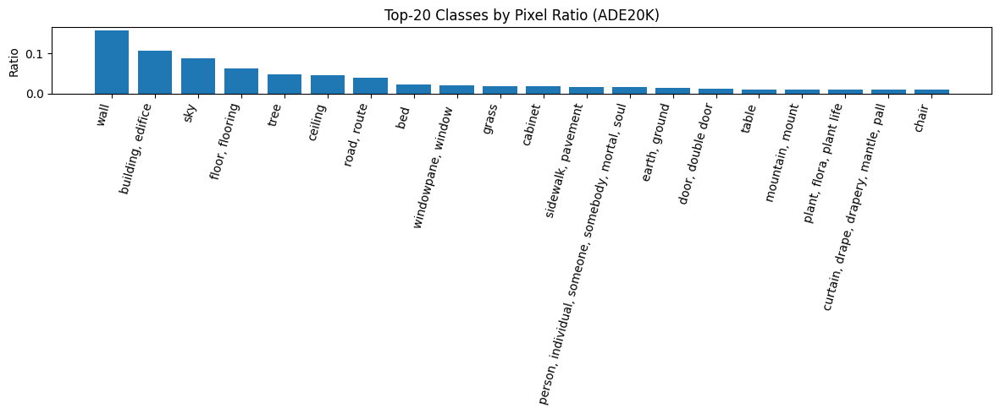

In [5]:
object_info = pd.read_csv(cfg.object_info_path, sep="\t")
print(object_info.head(10))
print("\nNum classes in objectInfo150:", len(object_info))

plt.figure(figsize=(12, 5))
plot_df = object_info.head(20).copy()
plt.bar(plot_df["Name"], plot_df["Ratio"])
plt.xticks(rotation=75, ha="right")
plt.title("Top-20 Classes by Pixel Ratio (ADE20K)")
plt.ylabel("Ratio")
plt.tight_layout()
plt.show()

In [6]:
# # Sample image-size distribution (sampled for speed)
# sample_n = min(3000, len(train_imgs))
# idx = np.random.choice(len(train_imgs), size=sample_n, replace=False)
# ws, hs = [], []
# for i in tqdm(idx, desc="Reading image sizes"):
#     with Image.open(train_imgs[int(i)]) as im:
#         w, h = im.size
#         ws.append(w)
#         hs.append(h)

# plt.figure(figsize=(12, 4))
# plt.subplot(1, 2, 1)
# plt.hist(ws, bins=40)
# plt.title("Width Distribution (train sample)")
# plt.subplot(1, 2, 2)
# plt.hist(hs, bins=40)
# plt.title("Height Distribution (train sample)")
# plt.tight_layout()
# plt.show()

# print("width min/max:", min(ws), max(ws))
# print("height min/max:", min(hs), max(hs))

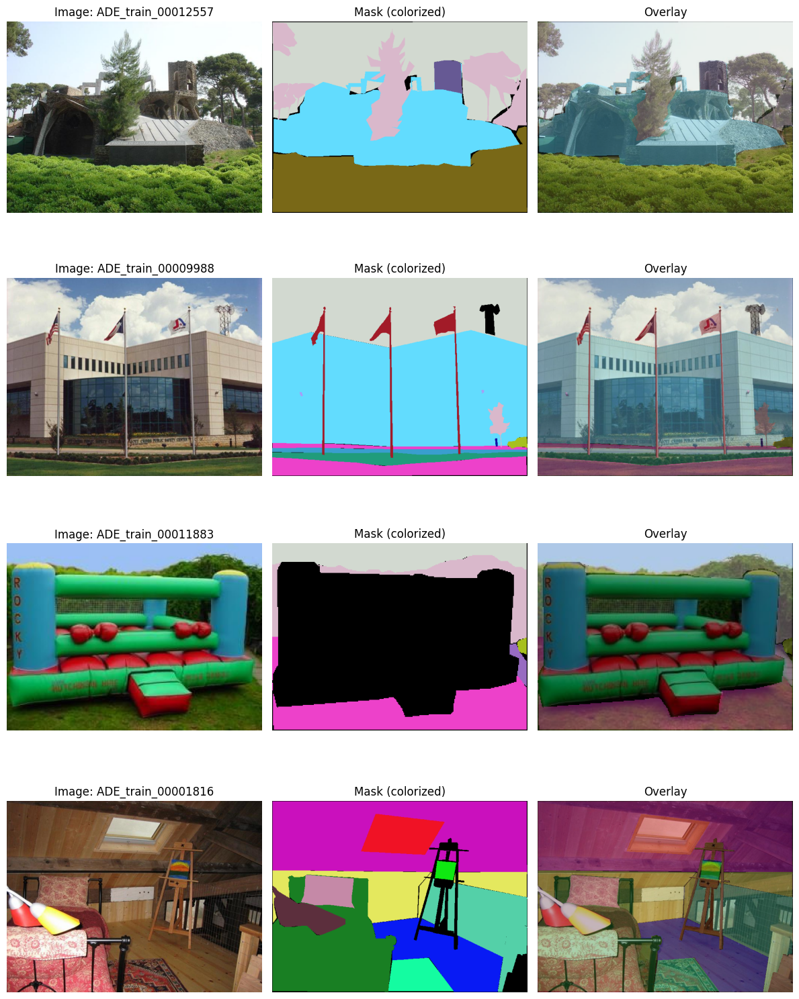

In [7]:
def make_palette(n=151, seed=13):
    rng = np.random.default_rng(seed)
    palette = rng.integers(0, 255, size=(n, 3), dtype=np.uint8)
    palette[0] = np.array([0, 0, 0], dtype=np.uint8)
    return palette

PALETTE = make_palette(cfg.num_classes)


def colorize_mask(mask_np: np.ndarray, palette: np.ndarray = PALETTE):
    return palette[mask_np]


def show_samples(n=4):
    indices = np.random.choice(len(train_imgs), size=n, replace=False)
    fig, axes = plt.subplots(n, 3, figsize=(12, 4 * n))
    if n == 1:
        axes = np.expand_dims(axes, 0)

    for r, i in enumerate(indices):
        img_path = train_imgs[int(i)]
        stem = Path(img_path).stem
        mask_path = str(Path(cfg.train_mask_dir) / f"{stem}.png")

        img = np.array(Image.open(img_path).convert("RGB"))
        mask = np.array(Image.open(mask_path), dtype=np.uint8)
        color_mask = colorize_mask(mask)
        overlay = (0.65 * img + 0.35 * color_mask).astype(np.uint8)

        axes[r, 0].imshow(img)
        axes[r, 0].set_title(f"Image: {stem}")
        axes[r, 1].imshow(color_mask)
        axes[r, 1].set_title("Mask (colorized)")
        axes[r, 2].imshow(overlay)
        axes[r, 2].set_title("Overlay")

        for c in range(3):
            axes[r, c].axis("off")

    plt.tight_layout()
    plt.show()

show_samples(n=4)

## 2) Dataset, DataLoader, and Augmentation
Augmentation strategy:
- Random scale
- Random crop with padding
- Random horizontal flip
- Color jitter

Validation and test use deterministic resize.

In [8]:
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]


def resize_pair(img, mask, size_hw):
    img = TF.resize(img, size_hw, interpolation=TF.InterpolationMode.BILINEAR)
    if mask is not None:
        mask = TF.resize(mask, size_hw, interpolation=TF.InterpolationMode.NEAREST)
    return img, mask


def random_scale(img, mask, base_size=512, scale_range=(0.75, 1.5)):
    scale = random.uniform(*scale_range)
    out_size = int(base_size * scale)
    return resize_pair(img, mask, (out_size, out_size))


def pad_if_smaller(img, mask, target=512):
    w, h = img.size
    pad_w = max(0, target - w)
    pad_h = max(0, target - h)
    if pad_w > 0 or pad_h > 0:
        img = TF.pad(img, [0, 0, pad_w, pad_h], fill=0)
        if mask is not None:
            mask = TF.pad(mask, [0, 0, pad_w, pad_h], fill=0)
    return img, mask


def random_crop(img, mask, crop_size=512):
    img, mask = pad_if_smaller(img, mask, crop_size)
    i, j, h, w = torchvision.transforms.RandomCrop.get_params(img, (crop_size, crop_size))
    img = TF.crop(img, i, j, h, w)
    if mask is not None:
        mask = TF.crop(mask, i, j, h, w)
    return img, mask


def train_transform(img, mask, image_size=512):
    img, mask = random_scale(img, mask, base_size=image_size, scale_range=(0.75, 1.5))
    img, mask = random_crop(img, mask, crop_size=image_size)

    if random.random() < 0.5:
        img = TF.hflip(img)
        mask = TF.hflip(mask)

    # Mild color augmentation
    if random.random() < 0.8:
        jitter = torchvision.transforms.ColorJitter(
            brightness=0.3, contrast=0.3, saturation=0.3, hue=0.05
        )
        img = jitter(img)

    img_t = TF.to_tensor(img)
    img_t = TF.normalize(img_t, mean=IMAGENET_MEAN, std=IMAGENET_STD)

    mask_np = np.array(mask, dtype=np.int64)
    mask_t = torch.from_numpy(mask_np)
    return img_t, mask_t


def eval_transform(img, mask, image_size=512):
    img, mask = resize_pair(img, mask, (image_size, image_size))

    img_t = TF.to_tensor(img)
    img_t = TF.normalize(img_t, mean=IMAGENET_MEAN, std=IMAGENET_STD)

    if mask is not None:
        mask_np = np.array(mask, dtype=np.int64)
        mask_t = torch.from_numpy(mask_np)
    else:
        mask_t = None
    return img_t, mask_t


class ADE20KSegDataset(Dataset):
    def __init__(self, split="train", image_size=512):
        self.split = split
        self.image_size = image_size

        if split == "train":
            self.img_dir = Path(cfg.train_img_dir)
            self.mask_dir = Path(cfg.train_mask_dir)
            self.images = sorted(self.img_dir.glob("*.jpg"))
            self.masks = [self.mask_dir / f"{p.stem}.png" for p in self.images]
        elif split == "val":
            self.img_dir = Path(cfg.val_img_dir)
            self.mask_dir = Path(cfg.val_mask_dir)
            self.images = sorted(self.img_dir.glob("*.jpg"))
            self.masks = [self.mask_dir / f"{p.stem}.png" for p in self.images]
        elif split == "test":
            self.img_dir = Path(cfg.test_img_dir)
            self.mask_dir = None
            self.images = sorted(self.img_dir.glob("*.jpg"))
            self.masks = [None] * len(self.images)
        else:
            raise ValueError(f"Unknown split: {split}")

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        mask_path = self.masks[idx]

        img = Image.open(img_path).convert("RGB")
        orig_w, orig_h = img.size

        if mask_path is not None:
            mask = Image.open(mask_path)
        else:
            mask = None

        if self.split == "train":
            img_t, mask_t = train_transform(img, mask, image_size=self.image_size)
        else:
            img_t, mask_t = eval_transform(img, mask, image_size=self.image_size)

        sample = {
            "image": img_t,
            "filename": img_path.name,
            "stem": img_path.stem,
            "orig_size": (orig_h, orig_w),
        }
        if mask_t is not None:
            sample["mask"] = mask_t
        return sample


# --- Dataset & DataLoader ---
train_ds = ADE20KSegDataset(split="train", image_size=cfg.image_size)
full_val_ds = ADE20KSegDataset(split="val", image_size=cfg.image_size)

# Split original val (~2k) → ~1k val + ~1k test for fair evaluation
generator = torch.Generator().manual_seed(cfg.seed)
val_indices, test_indices = torch.utils.data.random_split(
    range(len(full_val_ds)),
    [len(full_val_ds) // 2, len(full_val_ds) - len(full_val_ds) // 2],
    generator=generator,
)
val_ds = Subset(full_val_ds, val_indices.indices)
test_ds = Subset(full_val_ds, test_indices.indices)

print(f"Split original val ({len(full_val_ds)}) -> val ({len(val_ds)}) + test ({len(test_ds)})")

if cfg.quick_mode:
    train_ds = Subset(train_ds, list(range(min(cfg.quick_train_samples, len(train_ds)))))
    val_ds = Subset(val_ds, list(range(min(cfg.quick_val_samples, len(val_ds)))))

train_loader = DataLoader(
    train_ds,
    batch_size=cfg.batch_size,
    shuffle=True,
    num_workers=cfg.num_workers,
    pin_memory=True,
    drop_last=True,
)
val_loader = DataLoader(
    val_ds,
    batch_size=cfg.batch_size,
    shuffle=False,
    num_workers=cfg.num_workers,
    pin_memory=True,
)
test_loader = DataLoader(
    test_ds,
    batch_size=cfg.batch_size,
    shuffle=False,
    num_workers=cfg.num_workers,
    pin_memory=True,
)

print("train batches:", len(train_loader))
print("val batches:", len(val_loader))
print("test batches:", len(test_loader))

Split original val (2000) -> val (1000) + test (1000)
train batches: 842
val batches: 42
test batches: 42


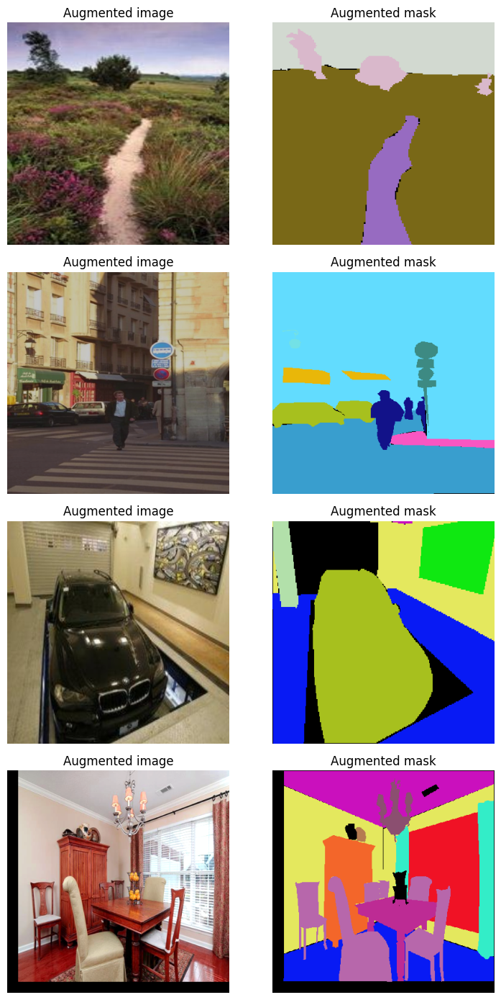

In [9]:
# Visualize augmented train samples
batch = next(iter(train_loader))
imgs = batch["image"][:4].cpu()
masks = batch["mask"][:4].cpu().numpy().astype(np.uint8)

# De-normalize for display
mean = np.array(IMAGENET_MEAN).reshape(1, 1, 3)
std = np.array(IMAGENET_STD).reshape(1, 1, 3)

fig, axes = plt.subplots(4, 2, figsize=(8, 14))
for i in range(4):
    img = imgs[i].permute(1, 2, 0).numpy()
    img = np.clip((img * std + mean), 0, 1)
    color_mask = colorize_mask(masks[i])

    axes[i, 0].imshow(img)
    axes[i, 0].set_title("Augmented image")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(color_mask)
    axes[i, 1].set_title("Augmented mask")
    axes[i, 1].axis("off")

plt.tight_layout()
plt.show()

## 3) Models (3 Methods)
Method A: Custom U-Net
Method B: DeepLabV3-ResNet50
Method C: FCN-ResNet50


In [10]:
class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.net(x)


class UNetSmall(nn.Module):
    def __init__(self, num_classes=151, base_ch=32):
        super().__init__()
        self.enc1 = DoubleConv(3, base_ch)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = DoubleConv(base_ch, base_ch * 2)
        self.pool2 = nn.MaxPool2d(2)
        self.enc3 = DoubleConv(base_ch * 2, base_ch * 4)
        self.pool3 = nn.MaxPool2d(2)
        self.enc4 = DoubleConv(base_ch * 4, base_ch * 8)
        self.pool4 = nn.MaxPool2d(2)

        self.bottleneck = DoubleConv(base_ch * 8, base_ch * 16)

        self.up4 = nn.ConvTranspose2d(base_ch * 16, base_ch * 8, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(base_ch * 16, base_ch * 8)
        self.up3 = nn.ConvTranspose2d(base_ch * 8, base_ch * 4, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(base_ch * 8, base_ch * 4)
        self.up2 = nn.ConvTranspose2d(base_ch * 4, base_ch * 2, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(base_ch * 4, base_ch * 2)
        self.up1 = nn.ConvTranspose2d(base_ch * 2, base_ch, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(base_ch * 2, base_ch)

        self.head = nn.Conv2d(base_ch, num_classes, kernel_size=1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        e3 = self.enc3(self.pool2(e2))
        e4 = self.enc4(self.pool3(e3))

        b = self.bottleneck(self.pool4(e4))

        d4 = self.up4(b)
        d4 = torch.cat([d4, e4], dim=1)
        d4 = self.dec4(d4)

        d3 = self.up3(d4)
        d3 = torch.cat([d3, e3], dim=1)
        d3 = self.dec3(d3)

        d2 = self.up2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)

        d1 = self.up1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)

        out = self.head(d1)
        return out


def build_unet(num_classes=151):
    return UNetSmall(num_classes=num_classes, base_ch=32)


def build_deeplabv3(num_classes=151):
    # robust against torchvision API differences
    try:
        weights_backbone = torchvision.models.ResNet50_Weights.IMAGENET1K_V2
        model = torchvision.models.segmentation.deeplabv3_resnet50(
            weights=None,
            weights_backbone=weights_backbone,
            num_classes=num_classes,
        )
    except Exception:
        model = torchvision.models.segmentation.deeplabv3_resnet50(
            pretrained=False,
            num_classes=num_classes,
        )
    return model


def build_fcn_resnet50(num_classes=151):
    # robust against torchvision API differences
    try:
        weights_backbone = torchvision.models.ResNet50_Weights.IMAGENET1K_V2
        model = torchvision.models.segmentation.fcn_resnet50(
            weights=None,
            weights_backbone=weights_backbone,
            num_classes=num_classes,
        )
    except Exception:
        model = torchvision.models.segmentation.fcn_resnet50(
            pretrained=False,
            num_classes=num_classes,
        )
    return model


def get_logits(model_output):
    if isinstance(model_output, dict):
        return model_output["out"]
    return model_output

## 4) Training and Evaluation Utilities
Metrics:
- mIoU (excluding ignore_index=0)
- Mean Dice (excluding ignore_index=0)
- Pixel Accuracy (excluding ignore_index=0)

In [11]:
def fast_hist(pred, target, num_classes=151, ignore_index=0):
    # pred/target: (H, W) numpy
    mask = target != ignore_index
    pred = pred[mask]
    target = target[mask]
    k = (target >= 0) & (target < num_classes)
    hist = np.bincount(
        num_classes * target[k].astype(int) + pred[k], minlength=num_classes ** 2
    ).reshape(num_classes, num_classes)
    return hist


def compute_metrics_from_hist(hist, ignore_index=0):
    hist = hist.astype(np.float64)
    diag = np.diag(hist)
    rows = hist.sum(axis=1)
    cols = hist.sum(axis=0)

    iou = diag / (rows + cols - diag + 1e-9)
    dice = (2.0 * diag) / (rows + cols + 1e-9)

    valid = np.ones(len(iou), dtype=bool)
    if 0 <= ignore_index < len(iou):
        valid[ignore_index] = False

    miou = iou[valid].mean()
    mdice = dice[valid].mean()
    pixel_acc = diag[valid].sum() / (rows[valid].sum() + 1e-9)

    return {
        "mIoU": float(miou),
        "mDice": float(mdice),
        "pixel_acc": float(pixel_acc),
        "class_iou": iou,
        "class_dice": dice,
    }


@torch.no_grad()
def evaluate_model(model, loader, criterion, device, num_classes=151, ignore_index=0, use_tta=False):
    model.eval()
    hist = np.zeros((num_classes, num_classes), dtype=np.int64)
    losses = []

    for batch in tqdm(loader, desc="Eval", leave=False):
        images = batch["image"].to(device, non_blocking=True)
        masks = batch["mask"].to(device, non_blocking=True)

        logits = get_logits(model(images))

        if use_tta:
            images_flip = torch.flip(images, dims=[3])
            logits_flip = get_logits(model(images_flip))
            logits_flip = torch.flip(logits_flip, dims=[3])
            logits = 0.5 * (logits + logits_flip)

        loss = criterion(logits, masks)
        losses.append(loss.item())

        pred = logits.argmax(dim=1).cpu().numpy()
        gt = masks.cpu().numpy()

        for p, g in zip(pred, gt):
            hist += fast_hist(p, g, num_classes=num_classes, ignore_index=ignore_index)

    metrics = compute_metrics_from_hist(hist, ignore_index=ignore_index)
    metrics["loss"] = float(np.mean(losses)) if losses else 0.0
    metrics["hist"] = hist
    return metrics


def train_one_epoch(model, loader, optimizer, scaler, criterion, device, use_amp=True):
    model.train()
    running = []

    pbar = tqdm(loader, desc="Train", leave=False)
    for batch in pbar:
        images = batch["image"].to(device, non_blocking=True)
        masks = batch["mask"].to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with torch.cuda.amp.autocast(enabled=use_amp and device.type == "cuda"):
            logits = get_logits(model(images))
            loss = criterion(logits, masks)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running.append(loss.item())
        pbar.set_postfix(loss=f"{np.mean(running[-20:]):.4f}")

    return float(np.mean(running)) if running else 0.0


def _save_checkpoint(path, epoch, model, optimizer, scheduler, scaler, best_miou, cfg, exp_name):
    payload = {
        "epoch": epoch,
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict(),
        "scheduler_state": scheduler.state_dict(),
        "scaler_state": scaler.state_dict() if scaler is not None else None,
        "best_miou": best_miou,
        "cfg": asdict(cfg),
        "exp_name": exp_name,
    }
    torch.save(payload, path)


def fit_experiment(exp_name, model, train_loader, val_loader, cfg, resume=True):
    model = model.to(DEVICE)

    criterion = nn.CrossEntropyLoss(ignore_index=cfg.ignore_index)
    optimizer = torch.optim.AdamW(model.parameters(), lr=cfg.lr, weight_decay=cfg.weight_decay)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=cfg.epochs)
    scaler = torch.cuda.amp.GradScaler(enabled=cfg.use_amp and DEVICE.type == "cuda")

    history = []
    best_miou = -1.0
    start_epoch = 1

    best_path = Path(cfg.ckpt_dir) / f"{exp_name}_best.pt"
    last_path = Path(cfg.ckpt_dir) / f"{exp_name}_last.pt"
    hist_path = Path(cfg.report_dir) / f"history_{exp_name}.csv"

    if hist_path.exists():
        try:
            history = pd.read_csv(hist_path).to_dict("records")
            if len(history) > 0:
                best_miou = max([float(r.get("val_mIoU", -1.0)) for r in history])
        except Exception as e:
            print(f"Warning: failed to read existing history for {exp_name}: {e}")

    if resume and last_path.exists():
        ckpt = torch.load(last_path, map_location="cpu")
        model.load_state_dict(ckpt["model_state"])

        if "optimizer_state" in ckpt and ckpt["optimizer_state"] is not None:
            try:
                optimizer.load_state_dict(ckpt["optimizer_state"])
            except Exception as e:
                print(f"Warning: optimizer state not restored for {exp_name}: {e}")

        if "scheduler_state" in ckpt and ckpt["scheduler_state"] is not None:
            try:
                scheduler.load_state_dict(ckpt["scheduler_state"])
            except Exception as e:
                print(f"Warning: scheduler state not restored for {exp_name}: {e}")

        if "scaler_state" in ckpt and ckpt["scaler_state"] is not None:
            try:
                scaler.load_state_dict(ckpt["scaler_state"])
            except Exception as e:
                print(f"Warning: scaler state not restored for {exp_name}: {e}")

        best_miou = max(best_miou, float(ckpt.get("best_miou", -1.0)))
        start_epoch = int(ckpt.get("epoch", 0)) + 1
        print(f"[Resume] {exp_name}: start from epoch {start_epoch}/{cfg.epochs}, best_mIoU={best_miou:.4f}")

    if start_epoch > cfg.epochs:
        print(f"{exp_name}: already trained up to epoch {cfg.epochs}. Skipping.")
        hist_df = pd.DataFrame(history)
        return hist_df, str(best_path)

    for epoch in range(start_epoch, cfg.epochs + 1):
        t0 = time.time()

        train_loss = train_one_epoch(
            model=model,
            loader=train_loader,
            optimizer=optimizer,
            scaler=scaler,
            criterion=criterion,
            device=DEVICE,
            use_amp=cfg.use_amp,
        )

        eval_every = getattr(cfg, 'eval_every', 1)
        do_eval = (epoch % eval_every == 0) or (epoch == cfg.epochs)

        if do_eval:
            val_metrics = evaluate_model(
                model=model,
                loader=val_loader,
                criterion=criterion,
                device=DEVICE,
                num_classes=cfg.num_classes,
                ignore_index=cfg.ignore_index,
                use_tta=False,
            )
        else:
            val_metrics = {"loss": 0.0, "mIoU": 0.0, "mDice": 0.0, "pixel_acc": 0.0}

        scheduler.step()

        row = {
            "epoch": epoch,
            "train_loss": train_loss,
            "val_loss": val_metrics["loss"],
            "val_mIoU": val_metrics["mIoU"],
            "val_mDice": val_metrics["mDice"],
            "val_pixel_acc": val_metrics["pixel_acc"],
            "lr": optimizer.param_groups[0]["lr"],
            "time_sec": time.time() - t0,
            "eval_skipped": not do_eval,
        }
        history.append(row)

        if do_eval and val_metrics["mIoU"] > best_miou:
            best_miou = val_metrics["mIoU"]
            _save_checkpoint(
                path=best_path,
                epoch=epoch,
                model=model,
                optimizer=optimizer,
                scheduler=scheduler,
                scaler=scaler,
                best_miou=best_miou,
                cfg=cfg,
                exp_name=exp_name,
            )

        if epoch % cfg.save_every == 0:
            _save_checkpoint(
                path=last_path,
                epoch=epoch,
                model=model,
                optimizer=optimizer,
                scheduler=scheduler,
                scaler=scaler,
                best_miou=best_miou,
                cfg=cfg,
                exp_name=exp_name,
            )

        if getattr(cfg, "keep_epoch_ckpt_every", 0) > 0 and epoch % cfg.keep_epoch_ckpt_every == 0:
            epoch_path = Path(cfg.ckpt_dir) / f"{exp_name}_epoch{epoch:03d}.pt"
            _save_checkpoint(
                path=epoch_path,
                epoch=epoch,
                model=model,
                optimizer=optimizer,
                scheduler=scheduler,
                scaler=scaler,
                best_miou=best_miou,
                cfg=cfg,
                exp_name=exp_name,
            )

        # Persist history every epoch for safe resume on Colab disconnect
        hist_df = pd.DataFrame(history)
        hist_df.to_csv(hist_path, index=False)

        print(
            f"[{exp_name}] Epoch {epoch:02d}/{cfg.epochs} | "
            f"train_loss={train_loss:.4f} | val_loss={val_metrics['loss']:.4f} | "
            f"mIoU={val_metrics['mIoU']:.4f} | mDice={val_metrics['mDice']:.4f} | "
            f"pixAcc={val_metrics['pixel_acc']:.4f}"
        )

        gc.collect()
        if DEVICE.type == "cuda":
            torch.cuda.empty_cache()

    hist_df = pd.DataFrame(history)
    hist_df.to_csv(hist_path, index=False)

    return hist_df, str(best_path)


## 5) Run Experiments (At Least 2 Methods)
You can switch `cfg.quick_mode=True` for a fast smoke test.
For final report, use full data and enough epochs.

In [12]:
EXPERIMENTS = [
    {
        "name": "unet_small",
        "builder": lambda: build_unet(num_classes=cfg.num_classes),
    },
    {
        "name": "deeplabv3_resnet50",
        "builder": lambda: build_deeplabv3(num_classes=cfg.num_classes),
    },
    {
        "name": "fcn_resnet50",
        "builder": lambda: build_fcn_resnet50(num_classes=cfg.num_classes),
    },
]

all_histories = {}
best_ckpts = {}

for exp in EXPERIMENTS:
    print("\n" + "=" * 80)
    print("Running experiment:", exp["name"])
    model = exp["builder"]()

    hist_df, best_path = fit_experiment(
        exp_name=exp["name"],
        model=model,
        train_loader=train_loader,
        val_loader=val_loader,
        cfg=cfg,
        resume=cfg.resume_training,
    )

    all_histories[exp["name"]] = hist_df
    best_ckpts[exp["name"]] = best_path

print("\nBest checkpoints:")
for k, v in best_ckpts.items():
    print(k, "->", v)


Running experiment: unet_small


/tmp/ipykernel_560/3407323583.py:117: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=cfg.use_amp and DEVICE.type == "cuda")


[Resume] unet_small: start from epoch 11/10, best_mIoU=0.0553
unet_small: already trained up to epoch 10. Skipping.

Running experiment: deeplabv3_resnet50
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 198MB/s]
/tmp/ipykernel_560/3407323583.py:117: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=cfg.use_amp and DEVICE.type == "cuda")


[Resume] deeplabv3_resnet50: start from epoch 11/10, best_mIoU=0.3900
deeplabv3_resnet50: already trained up to epoch 10. Skipping.

Running experiment: fcn_resnet50


/tmp/ipykernel_560/3407323583.py:117: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=cfg.use_amp and DEVICE.type == "cuda")


[Resume] fcn_resnet50: start from epoch 11/10, best_mIoU=0.3769
fcn_resnet50: already trained up to epoch 10. Skipping.

Best checkpoints:
unet_small -> /content/drive/MyDrive/CO5085_A2_ADE20K_Optimized/checkpoints/unet_small_best.pt
deeplabv3_resnet50 -> /content/drive/MyDrive/CO5085_A2_ADE20K_Optimized/checkpoints/deeplabv3_resnet50_best.pt
fcn_resnet50 -> /content/drive/MyDrive/CO5085_A2_ADE20K_Optimized/checkpoints/fcn_resnet50_best.pt


,experiment,best_epoch,best_val_mIoU,best_val_mDice,best_val_pixel_acc,val_loss_at_best
0,deeplabv3_resnet50,10,0.390049,0.521260,0.792676,0.709102
1,fcn_resnet50,10,0.376869,0.510877,0.777716,0.779795
2,unet_small,10,0.055268,0.077204,0.590510,1.696974


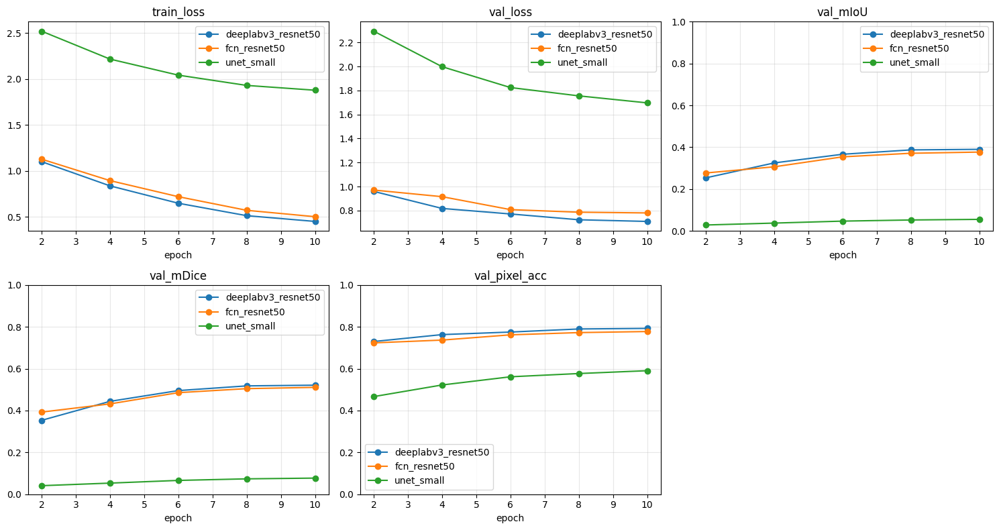

Saved:
- /content/drive/MyDrive/CO5085_A2_ADE20K_Optimized/reports/summary_metrics.csv
- /content/drive/MyDrive/CO5085_A2_ADE20K_Optimized/figures/training_curves.png


In [13]:
# Load histories from disk (safe even if kernel restarted)
history_files = sorted(Path(cfg.report_dir).glob("history_*.csv"))
if len(history_files) == 0:
    print("No history CSV found. Run training cell first.")
else:
    merged = []
    for f in history_files:
        name = f.stem.replace("history_", "")
        df = pd.read_csv(f)
        df["experiment"] = name
        merged.append(df)
    merged_df = pd.concat(merged, ignore_index=True)

    # Filter out epochs where eval was skipped (eval_every > 1)
    if "eval_skipped" in merged_df.columns:
        plot_df = merged_df[merged_df["eval_skipped"] != True].copy()
    else:
        plot_df = merged_df.copy()

    # Summary table: best epoch by val_mIoU
    summary_rows = []
    for name, g in plot_df.groupby("experiment"):
        best_row = g.loc[g["val_mIoU"].idxmax()]
        summary_rows.append(
            {
                "experiment": name,
                "best_epoch": int(best_row["epoch"]),
                "best_val_mIoU": float(best_row["val_mIoU"]),
                "best_val_mDice": float(best_row["val_mDice"]),
                "best_val_pixel_acc": float(best_row["val_pixel_acc"]),
                "val_loss_at_best": float(best_row["val_loss"]),
            }
        )
    summary_df = pd.DataFrame(summary_rows).sort_values("best_val_mIoU", ascending=False)
    display(summary_df)

    summary_path = Path(cfg.report_dir) / "summary_metrics.csv"
    summary_df.to_csv(summary_path, index=False)

    # Plot curves
    metrics_to_plot = ["train_loss", "val_loss", "val_mIoU", "val_mDice", "val_pixel_acc"]
    fig, axes = plt.subplots(2, 3, figsize=(15, 8))
    axes = axes.ravel()

    for i, metric in enumerate(metrics_to_plot):
        ax = axes[i]
        for name, g in plot_df.groupby("experiment"):
            ax.plot(g["epoch"], g[metric], marker="o", label=name)
        ax.set_title(metric)
        ax.set_xlabel("epoch")
        ax.grid(True, alpha=0.3)
        if metric in ["val_mIoU", "val_mDice", "val_pixel_acc"]:
            ax.set_ylim(0, 1)
        ax.legend()

    axes[-1].axis("off")
    plt.tight_layout()

    fig_path = Path(cfg.fig_dir) / "training_curves.png"
    plt.savefig(fig_path, dpi=180)
    plt.show()

    print("Saved:")
    print("-", summary_path)
    print("-", fig_path)

In [14]:
# Build class-name map from objectInfo150 (index 1..150)
obj_df = pd.read_csv(cfg.object_info_path, sep="\t")
class_name = {0: "background_or_ignore"}
for _, r in obj_df.iterrows():
    class_name[int(r["Idx"])] = str(r["Name"])


def load_model_for_eval(exp_name, ckpt_path):
    if "deeplab" in exp_name:
        model = build_deeplabv3(num_classes=cfg.num_classes)
    elif "fcn" in exp_name:
        model = build_fcn_resnet50(num_classes=cfg.num_classes)
    else:
        model = build_unet(num_classes=cfg.num_classes)

    state = torch.load(ckpt_path, map_location="cpu")
    model.load_state_dict(state["model_state"])
    model.to(DEVICE)
    model.eval()
    return model


criterion_eval = nn.CrossEntropyLoss(ignore_index=cfg.ignore_index)

analysis_rows = []
for exp_name, ckpt_path in best_ckpts.items():
    model = load_model_for_eval(exp_name, ckpt_path)

    # Val metrics (used during training for model selection)
    val_metrics = evaluate_model(
        model=model, loader=val_loader, criterion=criterion_eval,
        device=DEVICE, num_classes=cfg.num_classes,
        ignore_index=cfg.ignore_index, use_tta=False,
    )

    # Test metrics (held-out, fair evaluation)
    test_metrics = evaluate_model(
        model=model, loader=test_loader, criterion=criterion_eval,
        device=DEVICE, num_classes=cfg.num_classes,
        ignore_index=cfg.ignore_index, use_tta=False,
    )

    ious = test_metrics["class_iou"]
    valid_ids = list(range(1, cfg.num_classes))
    iou_pairs = [(cid, ious[cid]) for cid in valid_ids]
    iou_pairs_sorted = sorted(iou_pairs, key=lambda x: x[1], reverse=True)

    top5 = iou_pairs_sorted[:5]
    bottom5 = iou_pairs_sorted[-5:]

    print("\n", "=" * 80)
    print("Model:", exp_name)
    print(f"VAL  mIoU: {val_metrics['mIoU']:.4f} | TEST mIoU: {test_metrics['mIoU']:.4f}")
    print(f"VAL  mDice: {val_metrics['mDice']:.4f} | TEST mDice: {test_metrics['mDice']:.4f}")
    print("Top-5 IoU classes (TEST):")
    for cid, score in top5:
        print(f"  {cid:3d} | {class_name.get(cid, 'unknown')[:45]:45s} | IoU={score:.4f}")
    print("Bottom-5 IoU classes (TEST):")
    for cid, score in bottom5:
        print(f"  {cid:3d} | {class_name.get(cid, 'unknown')[:45]:45s} | IoU={score:.4f}")

    analysis_rows.append({
        "experiment": exp_name,
        "val_mIoU": val_metrics["mIoU"],
        "val_mDice": val_metrics["mDice"],
        "val_pixel_acc": val_metrics["pixel_acc"],
        "test_mIoU": test_metrics["mIoU"],
        "test_mDice": test_metrics["mDice"],
        "test_pixel_acc": test_metrics["pixel_acc"],
    })

analysis_df = pd.DataFrame(analysis_rows).sort_values("test_mIoU", ascending=False)
display(analysis_df)
analysis_df.to_csv(Path(cfg.report_dir) / "analysis_overall_metrics.csv", index=False)

Eval:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/42 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fded55da660>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process



Model: unet_small
VAL  mIoU: 0.0553 | TEST mIoU: 0.0556
VAL  mDice: 0.0772 | TEST mDice: 0.0782
Top-5 IoU classes (TEST):
    3 | sky                                           | IoU=0.8723
    6 | ceiling                                       | IoU=0.6023
    2 | building, edifice                             | IoU=0.5536
    5 | tree                                          | IoU=0.5184
    7 | road, route                                   | IoU=0.5055
Bottom-5 IoU classes (TEST):
  146 | shower                                        | IoU=0.0000
  147 | radiator                                      | IoU=0.0000
  148 | glass, drinking glass                         | IoU=0.0000
  149 | clock                                         | IoU=0.0000
  150 | flag                                          | IoU=0.0000


Eval:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/42 [00:00<?, ?it/s]


Model: deeplabv3_resnet50
VAL  mIoU: 0.3900 | TEST mIoU: 0.3932
VAL  mDice: 0.5213 | TEST mDice: 0.5231
Top-5 IoU classes (TEST):
    3 | sky                                           | IoU=0.9361
  115 | tent, collapsible shelter                     | IoU=0.9039
   57 | pool table, billiard table, snooker table     | IoU=0.8995
  110 | swimming pool, swimming bath, natatorium      | IoU=0.8616
    8 | bed                                           | IoU=0.8427
Bottom-5 IoU classes (TEST):
  104 | ship                                          | IoU=0.0000
  106 | conveyer belt, conveyor belt, conveyer, conve | IoU=0.0000
  129 | lake                                          | IoU=0.0000
  142 | crt screen                                    | IoU=0.0000
  146 | shower                                        | IoU=0.0000


Eval:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/42 [00:00<?, ?it/s]


Model: fcn_resnet50
VAL  mIoU: 0.3769 | TEST mIoU: 0.3688
VAL  mDice: 0.5109 | TEST mDice: 0.5038
Top-5 IoU classes (TEST):
    3 | sky                                           | IoU=0.9345
   57 | pool table, billiard table, snooker table     | IoU=0.8674
    8 | bed                                           | IoU=0.7856
   66 | toilet, can, commode, crapper, pot, potty, st | IoU=0.7729
   21 | car, auto, automobile, machine, motorcar      | IoU=0.7640
Bottom-5 IoU classes (TEST):
   96 | bannister, banister, balustrade, balusters, h | IoU=0.0068
  142 | crt screen                                    | IoU=0.0009
  104 | ship                                          | IoU=0.0000
  106 | conveyer belt, conveyor belt, conveyer, conve | IoU=0.0000
  146 | shower                                        | IoU=0.0000


,experiment,val_mIoU,val_mDice,val_pixel_acc,test_mIoU,test_mDice,test_pixel_acc
1,deeplabv3_resnet50,0.390048,0.521259,0.792676,0.393153,0.523081,0.782924
2,fcn_resnet50,0.376869,0.510877,0.777716,0.368763,0.503827,0.762856
0,unet_small,0.055268,0.077204,0.590510,0.055619,0.078244,0.581067


In [15]:
tta_rows = []
for exp_name, ckpt_path in best_ckpts.items():
    model = load_model_for_eval(exp_name, ckpt_path)

    no_tta = evaluate_model(
        model=model, loader=test_loader, criterion=criterion_eval,
        device=DEVICE, num_classes=cfg.num_classes,
        ignore_index=cfg.ignore_index, use_tta=False,
    )
    yes_tta = evaluate_model(
        model=model, loader=test_loader, criterion=criterion_eval,
        device=DEVICE, num_classes=cfg.num_classes,
        ignore_index=cfg.ignore_index, use_tta=True,
    )

    tta_rows.append({
        "experiment": exp_name,
        "test_mIoU_no_tta": no_tta["mIoU"],
        "test_mIoU_tta": yes_tta["mIoU"],
        "delta_mIoU": yes_tta["mIoU"] - no_tta["mIoU"],
        "test_mDice_no_tta": no_tta["mDice"],
        "test_mDice_tta": yes_tta["mDice"],
    })

tta_df = pd.DataFrame(tta_rows)
display(tta_df)
tta_df.to_csv(Path(cfg.report_dir) / "tta_comparison.csv", index=False)

Eval:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/42 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fded55da660>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fded55da660>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Eval:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/42 [00:00<?, ?it/s]

,experiment,test_mIoU_no_tta,test_mIoU_tta,delta_mIoU,test_mDice_no_tta,test_mDice_tta
0,unet_small,0.055619,0.056116,0.000497,0.078244,0.078807
1,deeplabv3_resnet50,0.393153,0.397905,0.004752,0.523081,0.527886
2,fcn_resnet50,0.368763,0.375233,0.006470,0.503827,0.510692


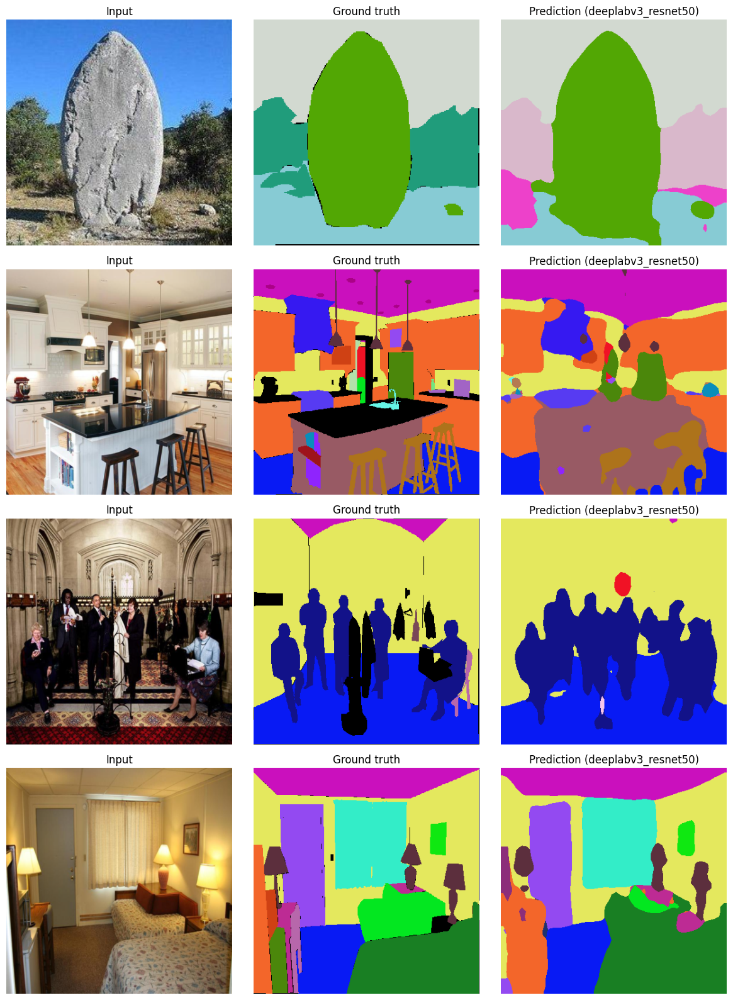

In [16]:
@torch.no_grad()
def run_predict_batch(model, images):
    logits = get_logits(model(images))
    logits[:, 0, :, :] = -1e9  # avoid predicting ignore class during visualization/test export
    pred = logits.argmax(dim=1)
    return pred


def denorm_image(img_t):
    img = img_t.permute(1, 2, 0).cpu().numpy()
    mean = np.array(IMAGENET_MEAN).reshape(1, 1, 3)
    std = np.array(IMAGENET_STD).reshape(1, 1, 3)
    img = np.clip(img * std + mean, 0, 1)
    return img


best_exp = sorted(best_ckpts.keys())[0]
if Path(cfg.report_dir, "summary_metrics.csv").exists():
    s = pd.read_csv(Path(cfg.report_dir, "summary_metrics.csv"))
    if len(s) > 0:
        best_exp = s.sort_values("best_val_mIoU", ascending=False).iloc[0]["experiment"]

model = load_model_for_eval(best_exp, best_ckpts[best_exp])

batch = next(iter(val_loader))
images = batch["image"].to(DEVICE)
gts = batch["mask"].cpu().numpy().astype(np.uint8)

preds = run_predict_batch(model, images).cpu().numpy().astype(np.uint8)

n_show = min(4, len(preds))
fig, axes = plt.subplots(n_show, 3, figsize=(12, 4 * n_show))
if n_show == 1:
    axes = np.expand_dims(axes, 0)

for i in range(n_show):
    img = denorm_image(batch["image"][i])
    gt = colorize_mask(gts[i])
    pr = colorize_mask(preds[i])

    axes[i, 0].imshow(img)
    axes[i, 0].set_title("Input")
    axes[i, 1].imshow(gt)
    axes[i, 1].set_title("Ground truth")
    axes[i, 2].imshow(pr)
    axes[i, 2].set_title(f"Prediction ({best_exp})")

    for c in range(3):
        axes[i, c].axis("off")

plt.tight_layout()
plt.show()

In [17]:
artifact = {
    "project": "CO5085 Assignment 2 - Segmentation on ADE20K",
    "dataset": {
        "train_images": len(train_imgs),
        "train_masks": len(train_masks),
        "val_images": len(val_imgs),
        "val_masks": len(val_masks),
        "test_images": len(test_imgs),
    },
    "experiments": {},
    "paths": {
        "report_dir": cfg.report_dir,
        "fig_dir": cfg.fig_dir,
        "ckpt_dir": cfg.ckpt_dir,
        "test_pred_dir": cfg.test_pred_dir,
    },
}

summary_csv = Path(cfg.report_dir) / "summary_metrics.csv"
if summary_csv.exists():
    summary_df = pd.read_csv(summary_csv)
    for _, r in summary_df.iterrows():
        artifact["experiments"][r["experiment"]] = {
            "best_epoch": int(r["best_epoch"]),
            "best_val_mIoU": float(r["best_val_mIoU"]),
            "best_val_mDice": float(r["best_val_mDice"]),
            "best_val_pixel_acc": float(r["best_val_pixel_acc"]),
        }

artifact_path = Path(cfg.report_dir) / "project_summary.json"
artifact_path.write_text(json.dumps(artifact, indent=2))
print("Saved:", artifact_path)
print(json.dumps(artifact, indent=2)[:1200])

Saved: /content/drive/MyDrive/CO5085_A2_ADE20K_Optimized/reports/project_summary.json
{
  "project": "CO5085 Assignment 2 - Segmentation on ADE20K",
  "dataset": {
    "train_images": 20210,
    "train_masks": 20210,
    "val_images": 2000,
    "val_masks": 2000,
    "test_images": 0
  },
  "experiments": {
    "deeplabv3_resnet50": {
      "best_epoch": 10,
      "best_val_mIoU": 0.3900485900759532,
      "best_val_mDice": 0.5212601483890709,
      "best_val_pixel_acc": 0.7926756482021446
    },
    "fcn_resnet50": {
      "best_epoch": 10,
      "best_val_mIoU": 0.3768689785886736,
      "best_val_mDice": 0.5108766480641375,
      "best_val_pixel_acc": 0.7777163158557697
    },
    "unet_small": {
      "best_epoch": 10,
      "best_val_mIoU": 0.0552682957828299,
      "best_val_mDice": 0.0772044488316587,
      "best_val_pixel_acc": 0.5905097797715749
    }
  },
  "paths": {
    "report_dir": "/content/drive/MyDrive/CO5085_A2_ADE20K_Optimized/reports",
    "fig_dir": "/content/drive

## 7) Grad-CAM Visualization for Segmentation Models
Visualize which regions the model focuses on when predicting specific classes.

In [18]:
!pip install -q opencv-python-headless

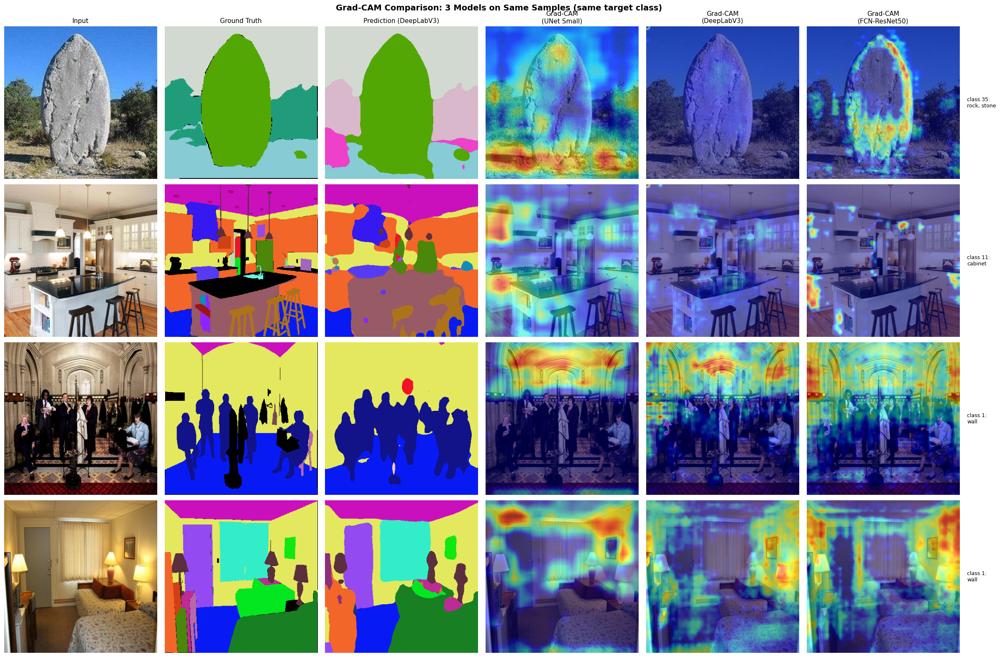

Saved: /content/drive/MyDrive/CO5085_A2_ADE20K_Optimized/figures/gradcam_3models.png


In [32]:
# --- Grad-CAM for Segmentation ---
import cv2

def disable_inplace_relu(model):
    """Disable inplace ReLU to avoid conflict with backward hooks."""
    for module in model.modules():
        if isinstance(module, nn.ReLU):
            module.inplace = False

class SegGradCAM:
    """Grad-CAM adapted for segmentation models."""

    def __init__(self, model, target_layer):
        self.model = model
        self.gradients = None
        self.activations = None

        # Register hooks
        target_layer.register_forward_hook(self._save_activation)
        target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, module, input, output):
        self.activations = output.detach()

    def _save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    @torch.enable_grad()
    def generate(self, image, target_class, device):
        """
        image: (1, 3, H, W) tensor
        target_class: int, class index to explain
        Returns: (H, W) numpy heatmap in [0, 1]
        """
        self.model.eval()
        disable_inplace_relu(self.model)
        image = image.to(device).requires_grad_(True)

        logits = get_logits(self.model(image))  # (1, C, H, W)

        # Create a spatial mask for target class and backprop
        score = logits[0, target_class, :, :].sum()
        self.model.zero_grad()
        score.backward()

        # Pool gradients over spatial dims → channel weights
        weights = self.gradients.mean(dim=(2, 3), keepdim=True)  # (1, C, 1, 1)
        cam = (weights * self.activations).sum(dim=1, keepdim=True)  # (1, 1, h, w)
        cam = torch.clamp(cam, min=0)

        # Upsample to input size
        cam = torch.nn.functional.interpolate(
            cam, size=image.shape[2:], mode="bilinear", align_corners=False
        )
        cam = cam.squeeze().cpu().numpy()

        # Normalize to [0, 1]
        if cam.max() > 0:
            cam = cam / cam.max()
        return cam


def get_target_layer(model, exp_name):
    """Get the last conv layer for Grad-CAM depending on model type."""
    if "deeplab" in exp_name:
        return model.backbone.layer4[-1].conv3  # last conv in ResNet layer4
    elif "fcn" in exp_name:
        return model.backbone.layer4[-1].conv3
    else:
        # UNet: use bottleneck
        return model.bottleneck.net[-2]  # last Conv2d before ReLU in bottleneck


def overlay_cam_on_image(img_np, cam, alpha=0.5, colormap=cv2.COLORMAP_JET):
    """Overlay heatmap on image. img_np in [0,1] float, cam in [0,1]."""
    heatmap = cv2.applyColorMap((cam * 255).astype(np.uint8), colormap)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0
    overlay = alpha * heatmap + (1 - alpha) * img_np
    return np.clip(overlay, 0, 1)


# --- Run Grad-CAM on val samples — all 3 models ---
batch = next(iter(val_loader))
images = batch["image"]
gts = batch["mask"].numpy().astype(np.uint8)

model_order = ["unet_small", "deeplabv3_resnet50", "fcn_resnet50"]
model_labels = ["UNet Small", "DeepLabV3", "FCN-ResNet50"]

n_show = min(4, len(images))
n_cols = 3 + len(model_order)  # Input + GT + Prediction(best) + 3 Grad-CAMs

fig, axes = plt.subplots(n_show, n_cols, figsize=(4 * n_cols, 4 * n_show))
if n_show == 1:
    axes = np.expand_dims(axes, 0)

# Column titles
col_titles = ["Input", "Ground Truth", "Prediction (DeepLabV3)"] + [f"Grad-CAM\n({l})" for l in model_labels]

for i in range(n_show):
    img_t = images[i].unsqueeze(0)
    gt = gts[i]
    img_np = denorm_image(images[i])

    # Get prediction from best model (DeepLabV3) for display
    best_model = load_model_for_eval("deeplabv3_resnet50", best_ckpts["deeplabv3_resnet50"])
    with torch.no_grad():
        pred = get_logits(best_model(img_t.to(DEVICE))).argmax(dim=1).squeeze().cpu().numpy()
    del best_model
    torch.cuda.empty_cache()

    # Dominant class from DeepLabV3 prediction (shared across models for fair comparison)
    unique, counts = np.unique(pred[pred > 0], return_counts=True)
    dominant_class = int(unique[counts.argmax()]) if len(unique) > 0 else 1

    axes[i, 0].imshow(img_np)
    axes[i, 1].imshow(colorize_mask(gt))
    axes[i, 2].imshow(colorize_mask(pred.astype(np.uint8)))

    if i == 0:
        axes[i, 0].set_title(col_titles[0], fontsize=11)
        axes[i, 1].set_title(col_titles[1], fontsize=11)
        axes[i, 2].set_title(col_titles[2], fontsize=11)

    # Grad-CAM for each model
    for j, (exp_name, label) in enumerate(zip(model_order, model_labels)):
        model_tmp = load_model_for_eval(exp_name, best_ckpts[exp_name])
        disable_inplace_relu(model_tmp)
        target_layer = get_target_layer(model_tmp, exp_name)
        gradcam_tmp = SegGradCAM(model_tmp, target_layer)

        cam = gradcam_tmp.generate(img_t, target_class=dominant_class, device=DEVICE)
        overlay = overlay_cam_on_image(img_np, cam, alpha=0.5)

        axes[i, 3 + j].imshow(overlay)
        if i == 0:
            axes[i, 3 + j].set_title(f"Grad-CAM\n({label})", fontsize=11)

        del model_tmp, gradcam_tmp
        torch.cuda.empty_cache()

    # Add class label on the right
    axes[i, n_cols - 1].annotate(
        f"class {dominant_class}:\n{class_name.get(dominant_class, '?')[:25]}",
        xy=(1.05, 0.5), xycoords="axes fraction", fontsize=9, va="center",
    )

    for c in range(n_cols):
        axes[i, c].axis("off")

plt.suptitle("Grad-CAM Comparison: 3 Models on Same Samples (same target class)", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig(Path(cfg.fig_dir) / "gradcam_3models.png", dpi=180)
plt.show()
print("Saved:", Path(cfg.fig_dir) / "gradcam_3models.png")

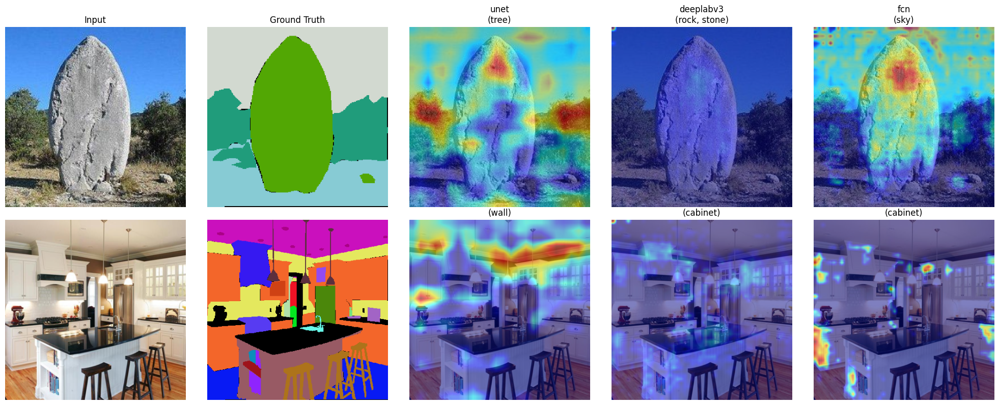

In [34]:
# --- Grad-CAM comparison across all 3 models ---
import cv2

# Pick 2 samples from val
batch = next(iter(val_loader))
n_samples = 2

fig, axes = plt.subplots(n_samples, 5, figsize=(20, 4 * n_samples))
col_titles = ["Input", "Ground Truth", "Grad-CAM (UNet)", "Grad-CAM (DeepLabV3)", "Grad-CAM (FCN)"]

model_order = ["unet_small", "deeplabv3_resnet50", "fcn_resnet50"]

for i in range(n_samples):
    img_t = batch["image"][i].unsqueeze(0)
    gt = batch["mask"][i].numpy().astype(np.uint8)
    img_np = denorm_image(batch["image"][i])

    axes[i, 0].imshow(img_np)
    axes[i, 0].set_title("Input" if i == 0 else "")
    axes[i, 1].imshow(colorize_mask(gt))
    axes[i, 1].set_title("Ground Truth" if i == 0 else "")

    for j, exp_name in enumerate(model_order):
        model_tmp = load_model_for_eval(exp_name, best_ckpts[exp_name])
        target_layer = get_target_layer(model_tmp, exp_name)
        gradcam_tmp = SegGradCAM(model_tmp, target_layer)

        # Get dominant predicted class
        with torch.no_grad():
            pred = get_logits(model_tmp(img_t.to(DEVICE))).argmax(dim=1).squeeze().cpu().numpy()
        unique, counts = np.unique(pred[pred > 0], return_counts=True)
        dominant_cls = int(unique[counts.argmax()]) if len(unique) > 0 else 1

        cam = gradcam_tmp.generate(img_t, target_class=dominant_cls, device=DEVICE)
        overlay = overlay_cam_on_image(img_np, cam, alpha=0.5)

        cls_label = class_name.get(dominant_cls, "?")[:20]
        axes[i, j + 2].imshow(overlay)
        axes[i, j + 2].set_title(f"{exp_name.split('_')[0]}\n({cls_label})" if i == 0 else f"({cls_label})")

        del model_tmp, gradcam_tmp
        torch.cuda.empty_cache()

    for c in range(5):
        axes[i, c].axis("off")

plt.tight_layout()
plt.savefig(Path(cfg.fig_dir) / "gradcam_comparison_3models.png", dpi=180)
plt.show()

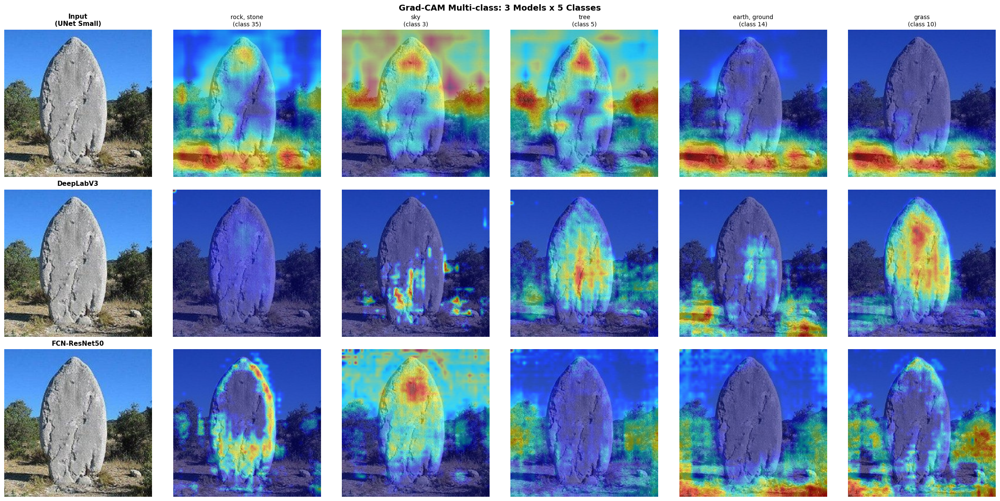

In [35]:
# --- Grad-CAM Multi-class: So sánh 3 models trên cùng 1 ảnh ---
import cv2

sample_idx = 0
img_t = batch["image"][sample_idx].unsqueeze(0)
img_np = denorm_image(batch["image"][sample_idx])

model_order = ["unet_small", "deeplabv3_resnet50", "fcn_resnet50"]
model_labels = ["UNet Small", "DeepLabV3", "FCN-ResNet50"]

# Get top-5 classes from DeepLabV3 prediction (dùng chung cho cả 3 models để so sánh công bằng)
ref_model = load_model_for_eval("deeplabv3_resnet50", best_ckpts["deeplabv3_resnet50"])
with torch.no_grad():
    ref_pred = get_logits(ref_model(img_t.to(DEVICE))).argmax(dim=1).squeeze().cpu().numpy()
unique, counts = np.unique(ref_pred[ref_pred > 0], return_counts=True)
top_classes = [int(c) for c in unique[np.argsort(-counts)[:5]]]
del ref_model
torch.cuda.empty_cache()

fig, axes = plt.subplots(3, len(top_classes) + 1, figsize=(4 * (len(top_classes) + 1), 12))

for row, (exp_name, label) in enumerate(zip(model_order, model_labels)):
    model_tmp = load_model_for_eval(exp_name, best_ckpts[exp_name])
    target_layer = get_target_layer(model_tmp, exp_name)
    gradcam_tmp = SegGradCAM(model_tmp, target_layer)

    axes[row, 0].imshow(img_np)
    axes[row, 0].set_title(f"Input\n({label})" if row == 0 else label, fontsize=11, fontweight="bold")
    axes[row, 0].axis("off")

    for j, cls_id in enumerate(top_classes):
        cam = gradcam_tmp.generate(img_t, target_class=cls_id, device=DEVICE)
        overlay = overlay_cam_on_image(img_np, cam, alpha=0.5)
        axes[row, j + 1].imshow(overlay)
        cls_label = class_name.get(cls_id, "?")[:18]
        if row == 0:
            axes[row, j + 1].set_title(f"{cls_label}\n(class {cls_id})", fontsize=10)
        axes[row, j + 1].axis("off")

    del model_tmp, gradcam_tmp
    torch.cuda.empty_cache()

plt.suptitle("Grad-CAM Multi-class: 3 Models x 5 Classes", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig(Path(cfg.fig_dir) / "gradcam_multiclass_3models.png", dpi=180)
plt.show()

## 8) Gradio Interactive Demo
Upload an image and get segmentation prediction with Grad-CAM overlay.

In [36]:
!pip install -q gradio

In [37]:
import gradio as gr

# Load best model for demo
demo_exp = best_exp_name
demo_model = load_model_for_eval(demo_exp, best_ckpts[demo_exp])
demo_target_layer = get_target_layer(demo_model, demo_exp)
demo_gradcam = SegGradCAM(demo_model, demo_target_layer)


def segment_and_explain(input_image, gradcam_class="auto"):
    """
    input_image: PIL Image from Gradio
    gradcam_class: 'auto' or integer class id
    """
    # Preprocess
    img = input_image.convert("RGB")
    img_t, _ = eval_transform(img, mask=None, image_size=cfg.image_size)
    img_batch = img_t.unsqueeze(0)

    # Predict
    with torch.no_grad():
        logits = get_logits(demo_model(img_batch.to(DEVICE)))
        logits[:, 0, :, :] = -1e9
        pred = logits.argmax(dim=1).squeeze().cpu().numpy().astype(np.uint8)

    # Denorm for display
    img_np = img_t.permute(1, 2, 0).numpy()
    mean = np.array(IMAGENET_MEAN).reshape(1, 1, 3)
    std = np.array(IMAGENET_STD).reshape(1, 1, 3)
    img_np = np.clip(img_np * std + mean, 0, 1)

    # Colorized prediction
    pred_color = colorize_mask(pred).astype(np.uint8)

    # Overlay prediction on image
    overlay_pred = (0.6 * img_np * 255 + 0.4 * pred_color).astype(np.uint8)

    # Grad-CAM
    if gradcam_class == "auto" or gradcam_class == "":
        unique, counts = np.unique(pred[pred > 0], return_counts=True)
        target_cls = int(unique[counts.argmax()]) if len(unique) > 0 else 1
    else:
        target_cls = int(gradcam_class)

    cam = demo_gradcam.generate(img_batch, target_class=target_cls, device=DEVICE)
    overlay_cam = overlay_cam_on_image(img_np, cam, alpha=0.5)
    overlay_cam = (overlay_cam * 255).astype(np.uint8)

    cls_label = class_name.get(target_cls, "unknown")

    # Class distribution in prediction
    unique, counts = np.unique(pred[pred > 0], return_counts=True)
    total_px = (pred > 0).sum()
    class_info = []
    for c, cnt in sorted(zip(unique, counts), key=lambda x: -x[1])[:10]:
        pct = cnt / total_px * 100 if total_px > 0 else 0
        class_info.append(f"{class_name.get(int(c), '?')} (id={c}): {pct:.1f}%")
    class_summary = "\n".join(class_info)

    return (
        pred_color,
        overlay_pred,
        overlay_cam,
        f"Grad-CAM target: {cls_label} (class {target_cls})\n\n"
        f"Top predicted classes:\n{class_summary}"
    )


# Build Gradio interface
with gr.Blocks(title="ADE20K Segmentation Demo") as demo:
    gr.Markdown(f"# ADE20K Semantic Segmentation — {demo_exp}")
    gr.Markdown("Upload an image to get segmentation prediction and Grad-CAM explanation.")

    with gr.Row():
        with gr.Column():
            input_img = gr.Image(type="pil", label="Input Image")
            gradcam_input = gr.Textbox(
                label="Grad-CAM class (leave 'auto' for dominant class)",
                value="auto",
            )
            run_btn = gr.Button("Run Segmentation", variant="primary")

        with gr.Column():
            out_pred = gr.Image(label="Prediction (colorized)")
            out_overlay = gr.Image(label="Prediction Overlay")
            out_cam = gr.Image(label="Grad-CAM Heatmap")
            out_info = gr.Textbox(label="Class Info", lines=8)

    run_btn.click(
        fn=segment_and_explain,
        inputs=[input_img, gradcam_input],
        outputs=[out_pred, out_overlay, out_cam, out_info],
    )

demo.launch(share=True, debug=False)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://a4bca8e421c7be2114.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
